# 1. Setup

In [4]:
!pip -q install "typer<0.10.0,>=0.3.0" openai langchain chromadb faiss-cpu tiktoken docarray huggingface_hub sentence-transformers langchain-openai sentencepiece llama-index torchvision gradio

In [5]:
# # Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 2. Environment setup

In [6]:
# Perform environment setup
from google.colab import userdata
import os
import openai
os.environ["OPENAI_API_KEY"] = userdata.get('openai_api_key')
openai.api_key = os.environ["OPENAI_API_KEY"]
openai_api_key = os.environ["OPENAI_API_KEY"]

# 3. Import Dependencies

In [7]:

# Importing necessary libraries
import gradio as gr  # Gradio for user interface
import os  # Operating system utilities
import tiktoken  # Assuming this is a custom library for tokenization
import openai  # OpenAI library for accessing GPT models
#import chromadb  # ChromaDB library for database operations
from pathlib import Path  # For handling file paths
import pandas as pd  # Pandas for data manipulation
from operator import itemgetter  # For sorting dictionaries
import json  # For working with JSON data
#from sklearn.feature_extraction.text import TfidfVectorizer  # TF-IDF vectorizer
#from sklearn.metrics.pairwise import cosine_similarity  # Cosine similarity calculation
#from nltk.corpus import stopwords  # Stopwords for text processing
#from nltk.tokenize import word_tokenize  # Tokenization
#import string  # String manipulation functions
from PIL import Image  # Image processing library
import requests  # For making HTTP requests
from io import BytesIO  # For handling binary data
import matplotlib.pyplot as plt  # Matplotlib for visualization
from matplotlib import table  # Table visualization in Matplotlib
import os  # Operating system utilities
import matplotlib.image as mpimg
import ast
# Import the CrossEncoder library from sentence_transformers
#from sentence_transformers import CrossEncoder, util
# Importing required functions and classes from ChromaDB
#from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

# 3. Data Connections and Retrieval

This section covers everything related to the retrieval step - e.g. the fetching of the data. Although this sounds simple, it can be subtly complex. This encompasses several key modules.

The following steps are followed to help process the Myntra Data Set documents efficiently:
* Document Loaders
* Text Splitters
* Text Embedding
* Vector Stores
* Retrievers

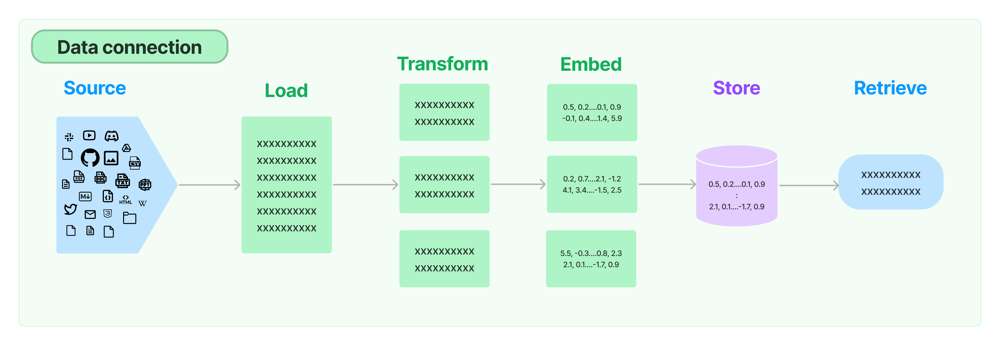

Load Myntra Dataset CSV File

In [8]:
df_csv_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/Fashion Dataset v2.csv",header="infer")

In [9]:
df_csv_data.head()

,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."


In [10]:
df_csv_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14214 entries, 0 to 14213
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   p_id          14214 non-null  int64  
 1   name          14214 non-null  object 
 2   products      14214 non-null  object 
 3   price         14214 non-null  float64
 4   colour        14214 non-null  object 
 5   brand         14214 non-null  object 
 6   img           14214 non-null  object 
 7   ratingCount   6530 non-null   float64
 8   avg_rating    6530 non-null   float64
 9   description   14214 non-null  object 
 10  p_attributes  14214 non-null  object 
dtypes: float64(3), int64(1), object(7)
memory usage: 1.2+ MB


In [11]:
# Function to convert to p_attributes to a dictionary
import re

def parse_myntra_dataset(input_string):
    # Parse the string into a dictionary using ast.literal_eval
    parsed_dict = dict(re.findall(r"(\S+): (.+?)(?=\n\S+|$)", input_string))

    return parsed_dict


In [12]:
# View a sample of p_attributes
str(df_csv_data.iloc[0,10])

"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,324,424', 'Body or Garment Size': 'Garment Measurements in', 'Bottom Closure': 'Slip-On', 'Bottom Fabric': 'Viscose Rayon', 'Bottom Pattern': 'Printed', 'Bottom Type': 'Palazzos', 'Character': 'NA', 'Dupatta': 'With Dupatta', 'Dupatta Border': 'Solid', 'Dupatta Fabric': 'Viscose Rayon', 'Dupatta Pattern': 'Printed', 'Main Trend': 'Indie Prints', 'Neck': 'Mandarin Collar', 'Number of Pockets': 'NA', 'Occasion': 'Festive', 'Ornamentation': 'NA', 'Pattern Coverage': 'Placement', 'Print or Pattern Type': 'Ethnic Motifs', 'Sleeve Length': 'Three-Quarter Sleeves', 'Sleeve Styling': 'Regular Sleeves', 'Slit Detail': 'NA', 'Stitch': 'Ready to Wear', 'Sustainable': 'Regular', 'Technique': 'Screen', 'Top Design Styling': 'Regular', 'Top Fabric': 'Viscose Rayon', 'Top Hemline': 'Flared', 'Top Length': 'Calf Length', 'Top Pattern': 'Printed', 'Top Shape': 'Anarkali', 'Top Type': 'Kurta', 'Waistband': 'Elasticated', 'Wash Care': 'Machine Wash', 'Weave Pa

In [13]:

# unpack p_attribute column headers
column_headers = list(ast.literal_eval(str(df_csv_data.iloc[0,10])).keys())
column_headers



['Add-Ons',
 'Body Shape ID',
 'Body or Garment Size',
 'Bottom Closure',
 'Bottom Fabric',
 'Bottom Pattern',
 'Bottom Type',
 'Character',
 'Dupatta',
 'Dupatta Border',
 'Dupatta Fabric',
 'Dupatta Pattern',
 'Main Trend',
 'Neck',
 'Number of Pockets',
 'Occasion',
 'Ornamentation',
 'Pattern Coverage',
 'Print or Pattern Type',
 'Sleeve Length',
 'Sleeve Styling',
 'Slit Detail',
 'Stitch',
 'Sustainable',
 'Technique',
 'Top Design Styling',
 'Top Fabric',
 'Top Hemline',
 'Top Length',
 'Top Pattern',
 'Top Shape',
 'Top Type',
 'Waistband',
 'Wash Care',
 'Weave Pattern',
 'Weave Type']

In [14]:
# Add as new columns into the existing data frame

for col_name in column_headers:
    df_csv_data[col_name] = "-"
    df_csv_data[col_name] = df_csv_data[col_name].astype('str')

df_csv_data.columns
print(df_csv_data.dtypes)

p_id                       int64
name                      object
products                  object
price                    float64
colour                    object
brand                     object
img                       object
ratingCount              float64
avg_rating               float64
description               object
p_attributes              object
Add-Ons                   object
Body Shape ID             object
Body or Garment Size      object
Bottom Closure            object
Bottom Fabric             object
Bottom Pattern            object
Bottom Type               object
Character                 object
Dupatta                   object
Dupatta Border            object
Dupatta Fabric            object
Dupatta Pattern           object
Main Trend                object
Neck                      object
Number of Pockets         object
Occasion                  object
Ornamentation             object
Pattern Coverage          object
Print or Pattern Type     object
Sleeve Len

In [15]:


# Function to unpack p_attributes dictionary
def unpack_attributes(df):
    temp_dict = {}
    for index, row in df.iterrows():
        temp_dict = dict(ast.literal_eval(str(row['p_attributes'])))
        for attribute_name, attribute_value in temp_dict.items():
            df.loc[index, str(attribute_name)] = str(attribute_value) if len(str(attribute_value)) > 0 else '-'
    return df

df_csv_data = unpack_attributes(df_csv_data.copy())



In [17]:
df_csv_data.fillna("-", inplace=True)

In [18]:
pd.set_option('display.max_columns', 100)
df_csv_data.head()

,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes,Add-Ons,Body Shape ID,Body or Garment Size,Bottom Closure,Bottom Fabric,Bottom Pattern,Bottom Type,Character,Dupatta,Dupatta Border,Dupatta Fabric,Dupatta Pattern,Main Trend,Neck,Number of Pockets,Occasion,Ornamentation,Pattern Coverage,Print or Pattern Type,Sleeve Length,Sleeve Styling,Slit Detail,Stitch,Sustainable,Technique,Top Design Styling,Top Fabric,Top Hemline,Top Length,Top Pattern,Top Shape,Top Type,Waistband,Wash Care,Weave Pattern,Weave Type,Style Tip,Colour Family,Design Styling,...,Surface Styling,Transparency,Type,taxMaterial,Contact Brand or Retailer for pre-sales product queries,Collection Name,Brand Fit Name,Distress,Effects,Fabric 3,Fade,Features,Fit,Reversible,Shade,Stretch,Type of Distress,Waist Rise,How to care for your denim,What it does for your body,Knit or Woven,Sport,Technology,Sub Trend,Sport Team,Fly Type,Type of Pleat,Trends,Blouse,Blouse Fabric,Border,Saree Fabric,Fusion Wear,Kurta Fabric,Kurta Pattern,Set Content,Blouse Closure,Choli Stitch,Lehenga Closure,Lehenga Fabric,Lehenga Lining Fabric,Lehenga Stitch,Regions,Pattern Size,Collar,Lining Fabric,Technology Present,Front Styling,Hood,Pocket
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",NA,"443,333,324,424",Garment Measurements in,Slip-On,Viscose Rayon,Printed,Palazzos,NA,With Dupatta,Solid,Viscose Rayon,Printed,Indie Prints,Mandarin Collar,NA,Festive,NA,Placement,Ethnic Motifs,Three-Quarter Sleeves,Regular Sleeves,NA,Ready to Wear,Regular,Screen,Regular,Viscose Rayon,Flared,Calf Length,Printed,Anarkali,Kurta,Elasticated,Machine Wash,Regular,Machine Weave,-,-,-,...,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",NA,"443,333,324,424",Garment Measurements in,Zip,Viscose Rayon,Solid,Palazzos,NA,With Dupatta,Printed,Organza,Printed,NA,Square Neck,NA,Fusion,NA,None,Solid,Sleeveless,Shoulder Straps,NA,Ready to Wear,Regular,NA,Regular,Viscose Rayon,Flared,Calf Length,Solid,A-Line,Kurta,Elasticated,Hand Wash,Regular,Machine Weave,-,-,-,...,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.16153,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",NA,"333,424",Garment Measurements in,Slip-On,Viscose Rayon,Printed,Trousers,NA,With Dupatta,Tassels,Voile,Embroidered,NA,Round Neck,NA,Daily,Thread Work,Large,Ethnic Motifs,Three-Quarter Sleeves,No Sleeves,NA,Ready to Wear,Regular,Foil,Regular,Viscose Rayon,Flared,Above Knee,Embroidered,A-Line,Kurta,Elasticated,Hand Wash,Regular,Machine Weave,-,-,-,...,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",NA,"333,424",Garment Measurements in,Slip-On,Pure Cotton,Printed,Trousers,NA,With Dupatta,Printed,Cotton Blend,Printed,NA,Round Neck,NA,Daily,NA,Large,Ethnic Motifs,Three-Quarter Sleeves,Regular Sleeves,Front Slit,Ready to Wear,Regular,NA,Empire,Pure Cotton,Flared,Calf Length,

In [ ]:
# Drop all rows from the existing DataFrame
# df_csv_data.drop(df_csv_data.index, inplace=True)

In [20]:
print(df_csv_data.head(1))

       p_id                                               name  \
0  17048614  Khushal K Women Black Ethnic Motifs Printed Ku...   

                   products   price colour      brand  \
0  Kurta, Palazzos, Dupatta  5099.0  Black  Khushal K   

                                                 img ratingCount avg_rating  \
0  http://assets.myntassets.com/assets/images/170...      4522.0   4.418399   

                                         description  \
0  Black printed Kurta with Palazzos with dupatta...   

                                        p_attributes Add-Ons    Body Shape ID  \
0  {'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...      NA  443,333,324,424   

      Body or Garment Size Bottom Closure  Bottom Fabric Bottom Pattern  \
0  Garment Measurements in        Slip-On  Viscose Rayon        Printed   

  Bottom Type Character       Dupatta Dupatta Border Dupatta Fabric  \
0    Palazzos        NA  With Dupatta          Solid  Viscose Rayon   

  Dupatta Pattern    Ma

In [21]:
from bs4 import BeautifulSoup


def clean_html_tags(description):
    # Parse the HTML content using BeautifulSoup
    description = str(description)
    description = description.replace('<br>', ' ')
    soup = BeautifulSoup(description, 'html.parser')
    # Extract text from the parsed content
    cleaned_description = ' '.join(soup.stripped_strings)
    # Remove extra whitespace
    #cleaned_description = ' '.join(cleaned_description.striped_strings)
    return str(cleaned_description) if len(str(cleaned_description)) > 0 else '-'


# Apply the function to clean the description column
df_csv_data['description'] = df_csv_data['description'].apply(clean_html_tags)

# Print the DataFrame with cleaned description column
df_csv_data['description'].head()


<ipython-input-21-49efda2828e1>:8: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(description, 'html.parser')


0    Black printed Kurta with Palazzos with dupatta...
1    Orange solid Kurta with Palazzos with dupatta ...
2    Navy blue embroidered Kurta with Trousers with...
3    Red printed kurta with trouser and dupatta Kur...
4    Black and green printed straight kurta, has a ...
Name: description, dtype: object

In [22]:
pd.options.display.max_colwidth = None

# Print the DataFrame with cleaned description column
df_csv_data[['description']].head()

,description
0,"Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width: 88 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash"
1,"Orange solid Kurta with Palazzos with dupatta Kurta design: Solid A-line shape Regular style Square neck, sleeveless shoulder straps Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Zip closure Dupatta Design: Floral Printed Kurta Fabric: Viscose rayon Bottom Fabric: Viscose rayon Dupatta Fabric: Organza Hand washThe model (height 5'8) is wearing a size S"
2,"Navy blue embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered A-line shape Regular style Round neck, three-quarter no sleeves Thread work detail Above knee length with flared hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Viscose rayon Hand WashThe model (height 5'8) is wearing a size S"
3,Red printed kurta with trouser and dupatta Kurta design: Printed kurta Anarkali design Round neck Three-quarter sleeves Flared hem Calf length Trouser design: Printed trousers Elasticated waistband Slip-on closure Dupatta design: White and red printed dupatta Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Cotton Blend Hand washDupatta length: 2 metres (approx.) The model (height 5'8) is wearing a size S
4,"Black and green printed straight kurta, has a nitched round neck, three-quarter sleeves, straight hem, side slitsMaterial: Cotton Machine WashThe model (height 5'8"") is wearing a size S"


In [23]:

# Apply the function to clean the Care for me column
df_csv_data['Care for me'] = df_csv_data['Care for me'].apply(clean_html_tags)

# Print the DataFrame with cleaned Care for me  column
df_csv_data['Care for me'].head()


0    -
1    -
2    -
3    -
4    -
Name: Care for me, dtype: object

In [24]:
list(df_csv_data.columns)

['p_id',
 'name',
 'products',
 'price',
 'colour',
 'brand',
 'img',
 'ratingCount',
 'avg_rating',
 'description',
 'p_attributes',
 'Add-Ons',
 'Body Shape ID',
 'Body or Garment Size',
 'Bottom Closure',
 'Bottom Fabric',
 'Bottom Pattern',
 'Bottom Type',
 'Character',
 'Dupatta',
 'Dupatta Border',
 'Dupatta Fabric',
 'Dupatta Pattern',
 'Main Trend',
 'Neck',
 'Number of Pockets',
 'Occasion',
 'Ornamentation',
 'Pattern Coverage',
 'Print or Pattern Type',
 'Sleeve Length',
 'Sleeve Styling',
 'Slit Detail',
 'Stitch',
 'Sustainable',
 'Technique',
 'Top Design Styling',
 'Top Fabric',
 'Top Hemline',
 'Top Length',
 'Top Pattern',
 'Top Shape',
 'Top Type',
 'Waistband',
 'Wash Care',
 'Weave Pattern',
 'Weave Type',
 'Style Tip',
 'Colour Family',
 'Design Styling',
 'Fabric',
 'Fabric 2',
 'Fabric Purity',
 'Hemline',
 'Length',
 'Pattern',
 'Shape',
 'Care for me',
 'Where-to-wear',
 'Wedding',
 'About the Brand',
 'Better Cotton Initiative',
 'Center Front Open',
 'Closure

In [25]:
# list of features column names of each product
combined_text_cols = \
[ 'name',
 'products',
 'price',
 'colour',
 'brand',
 'ratingCount',
 'avg_rating',
 'description',
 'Add-Ons',
 'Body Shape ID',
 'Body or Garment Size',
 'Bottom Closure',
 'Bottom Fabric',
 'Bottom Pattern',
 'Bottom Type',
 'Character',
 'Dupatta',
 'Dupatta Border',
 'Dupatta Fabric',
 'Dupatta Pattern',
 'Main Trend',
 'Neck',
 'Number of Pockets',
 'Occasion',
 'Ornamentation',
 'Pattern Coverage',
 'Print or Pattern Type',
 'Sleeve Length',
 'Sleeve Styling',
 'Slit Detail',
 'Stitch',
 'Sustainable',
 'Technique',
 'Top Design Styling',
 'Top Fabric',
 'Top Hemline',
 'Top Length',
 'Top Pattern',
 'Top Shape',
 'Top Type',
 'Waistband',
 'Wash Care',
 'Weave Pattern',
 'Weave Type',
 'Style Tip',
 'Colour Family',
 'Design Styling',
 'Fabric',
 'Fabric 2',
 'Fabric Purity',
 'Hemline',
 'Length',
 'Pattern',
 'Shape',
 'Care for me',
 'Where-to-wear',
 'Wedding',
 'About the Brand',
 'Better Cotton Initiative',
 'Center Front Open',
 'Closure',
 'Fabric Type',
 'Lining',
 'Multipack Set',
 'Surface Styling',
 'Transparency',
 'Type',
 'taxMaterial',
 'Contact Brand or Retailer for pre-sales product queries',
 'Collection Name',
 'Brand Fit Name',
 'Distress',
 'Effects',
 'Fabric 3',
 'Fade',
 'Features',
 'Fit',
 'Reversible',
 'Shade',
 'Stretch',
 'Type of Distress',
 'Waist Rise',
 'How to care for your denim',
 'What it does for your body',
 'Knit or Woven',
 'Sport',
 'Technology',
 'Sub Trend',
 'Sport Team',
 'Fly Type',
 'Type of Pleat',
 'Trends',
 'Blouse',
 'Blouse Fabric',
 'Border',
 'Saree Fabric',
 'Fusion Wear',
 'Kurta Fabric',
 'Kurta Pattern',
 'Set Content',
 'Choli Stitch',
 'Blouse Closure',
 'Lehenga Closure',
 'Lehenga Fabric',
 'Lehenga Lining Fabric',
 'Lehenga Stitch',
 'Regions',
 'Pattern Size',
 'Collar',
 'Lining Fabric',
 'Technology Present',
 'Front Styling',
 'Hood',
 'Pocket']

In [26]:
import pandas as pd
import numpy as np

def create_combined_text(df):
    for index, row in df.iterrows():
        combined_str = ""
        for col_name in combined_text_cols:
            value = row[col_name]
            if isinstance(value, str) and not value.strip():
              value = '-'  # Ensure value is not an empty string
            elif isinstance(value, float):  # Check for NaN float first
                if np.isnan(value):
                    value = '-'  # Convert a NaN float to an empty string
                else:
                    value = str(value)

            if isinstance(value, str) and value.lower().strip() == 'na':
                value = 'NA'
            elif isinstance(value, str) and value.lower().strip() == '-':
                value = ' '

            if value.strip():  # Ensure value is not an empty string
              combined_str += f"\n{col_name}: {value}"
        df.loc[index, 'combined_text'] = combined_str.strip()
    return df


# Assuming you have loaded your DataFrame as 'df_csv_data'
df_csv_data = create_combined_text(df_csv_data.copy())

df_csv_data['combined_text'].head()

0    name: Khushal K Women Black Ethnic Motifs Printed Kurta with Palazzos & With Dupatta\nproducts: Kurta, Palazzos, Dupatta\nprice: 5099.0\ncolour: Black\nbrand: Khushal K\nratingCount: 4522.0\navg_rating: 4.4183989385227775\ndescription: Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar,  three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width: 88 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash\nAdd-Ons: NA\nBody Shape ID: 443,333,324,424\nBody or Garment Size: Garment Measurements in\nBottom Closure: Slip-On\nBottom Fabric: Viscose Rayon\nBottom Pattern: Printed\nBottom Type: Palazzos\nCharacter: NA\nDupatta: With Dupatta\nDupatta Border: Solid\nDupatta Fabric: Viscose Rayon\nDupatta Pattern: Printed\nMain Trend: Indie Prints\nNeck: Mandarin Col

In [27]:
# Check shape the dataframe
df_csv_data.shape

(14214, 118)

In [28]:
preprocessed_cols = \
[ 'Filename',
 'p_id',
 'img',
'combined_text']

In [29]:
df_csv_data["Filename"] = "Fashion Dataset v2.csv"

In [30]:
df_csv_data[preprocessed_cols].head()

,Filename,p_id,img,combined_text
0,Fashion Dataset v2.csv,17048614,http://assets.myntassets.com/assets/images/17048614/2022/2/4/b0eb9426-adf2-4802-a6b3-5dbacbc5f2511643971561167KhushalKWomenBlackEthnicMotifsAngrakhaBeadsandStonesKurtawit7.jpg,"name: Khushal K Women Black Ethnic Motifs Printed Kurta with Palazzos & With Dupatta\nproducts: Kurta, Palazzos, Dupatta\nprice: 5099.0\ncolour: Black\nbrand: Khushal K\nratingCount: 4522.0\navg_rating: 4.4183989385227775\ndescription: Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width: 88 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash\nAdd-Ons: NA\nBody Shape ID: 443,333,324,424\nBody or Garment Size: Garment Measurements in\nBottom Closure: Slip-On\nBottom Fabric: Viscose Rayon\nBottom Pattern: Printed\nBottom Type: Palazzos\nCharacter: NA\nDupatta: With Dupatta\nDupatta Border: Solid\nDupatta Fabric: Viscose Rayon\nDupatta Pattern: Printed\nMain Trend: Indie Prints\nNeck: Mandarin Collar\nNumber of Pockets: NA\nOccasion: Festive\nOrnamentation: NA\nPattern Coverage: Placement\nPrint or Pattern Type: Ethnic Motifs\nSleeve Length: Three-Quarter Sleeves\nSleeve Styling: Regular Sleeves\nSlit Detail: NA\nStitch: Ready to Wear\nSustainable: Regular\nTechnique: Screen\nTop Design Styling: Regular\nTop Fabric: Viscose Rayon\nTop Hemline: Flared\nTop Length: Calf Length\nTop Pattern: Printed\nTop Shape: Anarkali\nTop Type: Kurta\nWaistband: Elasticated\nWash Care: Machine Wash\nWeave Pattern: Regular\nWeave Type: Machine Weave"
1,Fashion Dataset v2.csv,16524740,http://assets.myntassets.com/assets/images/16524740/2021/12/29/17ab2ac8-2e60-422d-9d20-2527415932361640754214931-STRAPPY-SET-IN-ORANGE-WITH-ORGANZA-DUPATTA-5961640754214349-2.jpg,"name: InWeave Women Orange Solid Kurta with Palazzos & Floral Print Dupatta\nproducts: Kurta, Palazzos, Floral Print Dupatta\nprice: 5899.0\ncolour: Orange\nbrand: InWeave\nratingCount: 1081.0\navg_rating: 4.119333950046253\ndescription: Orange solid Kurta with Palazzos with dupatta Kurta design: Solid A-line shape Regular style Square neck, sleeveless shoulder straps Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Zip closure Dupatta Design: Floral Printed Kurta Fabric: Viscose rayon Bottom Fabric: Viscose rayon Dupatta Fabric: Organza Hand washThe model (height 5'8) is wearing a size S\nAdd-Ons: NA\nBody Shape ID: 443,333,324,424\nBody or Garment Size: Garment Measurements in\nBottom Closure: Zip\nBottom Fabric: Viscose Rayon\nBottom Pattern: Solid\nBottom Type: Palazzos\nCharacter: NA\nDupatta: With Dupatta\nDupatta Border: Printed\nDupatta Fabric: Organza\nDupatta Pattern: Printed\nMain Trend: NA\nNeck: Square Neck\nNumber of Pockets: NA\nOccasion: Fusion\nOrnamentation: NA\nPattern Coverage: None\nPrint or Pattern Type: Solid\nSleeve Length: Sleeveless\nSleeve Styling: Shoulder Straps\nSlit Detail: NA\nStitch: Ready to Wear\nSustainable: Regular\nTechnique: NA\nTop Design Styling: Regular\nTop Fabric: Viscose Rayon\nTop Hemline: Flared\nTop Length: Calf Length\nTop Pattern: Solid\nTop Shape: A-Line\nTop Type: Kurta\nWaistband: Elasticated\nWash Care: Hand Wash\nWeave Pattern: Regular\nWeave Type: Machine Weave"
2,Fashion Dataset v2.csv,16331376,http://assets.myntassets.com/assets/images/16331376/2021/12/2/b8c4f90f-683c-48d2-b8ac-19891a87c0651638428628378KurtaSets1.jpg,"name: Anubhutee Women Navy Blue Ethnic Motifs Embroidered Thread Work Kurta with Trousers & With Dupatta\nproducts: Kurta, Trousers, Dupatta\nprice: 4899.0\ncolour: Navy Blue\nbrand: Anubhutee\nratingCount: 1752.0\navg_rating: 4.161529680365297\ndescription: Navy blue embroidered Kurta with Trousers with dupatta Kurta design: E

In [31]:
df_csv_data[preprocessed_cols].to_csv("/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/preprocessed.csv",index=False,na_rep='')
# [["Filename","p_id","img","combined_text"]]

In [32]:
# Import the CSVLoader class from LangChain
from langchain.document_loaders import CSVLoader

In [33]:
# Instantiate an object of the class to read the csv data
loader = CSVLoader("/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/preprocessed.csv",
                   metadata_columns=['Filename','p_id','img'])
# Load data from the csv file using the load command
csv_data = loader.load()
#check the type of csv_data
type(csv_data) ## The document is in list format

list

In [34]:
csv_data[0]


Document(page_content="combined_text: name: Khushal K Women Black Ethnic Motifs Printed Kurta with Palazzos & With Dupatta\nproducts: Kurta, Palazzos, Dupatta\nprice: 5099.0\ncolour: Black\nbrand: Khushal K\nratingCount: 4522.0\navg_rating: 4.4183989385227775\ndescription: Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar,  three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width:\xa088 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash\nAdd-Ons: NA\nBody Shape ID: 443,333,324,424\nBody or Garment Size: Garment Measurements in\nBottom Closure: Slip-On\nBottom Fabric: Viscose Rayon\nBottom Pattern: Printed\nBottom Type: Palazzos\nCharacter: NA\nDupatta: With Dupatta\nDupatta Border: Solid\nDupatta Fabric: Viscose Rayon\nDupatta Pattern: Printed\nMain Tre

In [35]:
print(csv_data[0].page_content)

combined_text: name: Khushal K Women Black Ethnic Motifs Printed Kurta with Palazzos & With Dupatta
products: Kurta, Palazzos, Dupatta
price: 5099.0
colour: Black
brand: Khushal K
ratingCount: 4522.0
avg_rating: 4.4183989385227775
description: Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar,  three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width: 88 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash
Add-Ons: NA
Body Shape ID: 443,333,324,424
Body or Garment Size: Garment Measurements in
Bottom Closure: Slip-On
Bottom Fabric: Viscose Rayon
Bottom Pattern: Printed
Bottom Type: Palazzos
Character: NA
Dupatta: With Dupatta
Dupatta Border: Solid
Dupatta Fabric: Viscose Rayon
Dupatta Pattern: Printed
Main Trend: Indie Prints
Neck: Mandarin Collar
Number 

### [Text Embedding Models](https://python.langchain.com/docs/modules/data_connection/text_embedding/)

The Embeddings class is a class designed for interfacing with text embedding models. LangChain provides support for most of the embedding model providers (OpenAI, Cohere) including sentence transformers library from Hugging Face.

Embeddings create a vector representation of a piece of text and supports all the operations such as similarity search, text comparison, sentiment analysis etc.

The base Embeddings class in LangChain provides two methods: one for embedding documents and one for embedding a query.

The first method takes as input multiple texts, while the second method returns the embedding representation for a single text.


In [36]:
# Import the OpenAI Embeddings class from LangChain
#from langchain.embeddings import OpenAIEmbeddings
from langchain_openai import OpenAIEmbeddings
embeddings_model = OpenAIEmbeddings(openai_api_key=openai_api_key)

In [37]:
embeddings = embeddings_model.embed_documents([csv_data[0].page_content])
len(embeddings), len(embeddings[0])

(1, 1536)

In [38]:

# View the embeddings
# embeddings
(embeddings)

[[-0.038482359983026085,
  0.0011350997791644147,
  0.014294229240278077,
  -0.006665401995252652,
  -0.022274946470463918,
  0.01225805264793107,
  -0.0180522722364743,
  -0.026634275526487682,
  -0.020703401115910312,
  -0.035749237465311536,
  0.02056674443123105,
  0.015865774594831687,
  -0.0015322565809913838,
  0.0014058496831735373,
  -0.011950576504386568,
  0.0430466749973913,
  0.020484750792952512,
  -0.021605331136974184,
  0.013829598002484678,
  -0.03000968278581416,
  -0.0119574096180173,
  0.02056674443123105,
  -0.010194545463706258,
  -0.004765881621923628,
  -0.025664018094406736,
  0.024707425026942134,
  0.02006111637429838,
  -0.018571564658023308,
  -0.013563118678079442,
  -0.014758859546748916,
  -0.0028885686350638403,
  0.0038810334536140217,
  -0.005869380113191032,
  -0.010180880167767357,
  -0.019446164087209377,
  0.020033785782420578,
  -0.0016108338952851922,
  0.007823562135936945,
  0.005445746160198179,
  0.005623398732694149,
  0.013317137763243841

### Vector Stores

One of the most common ways to store and search over unstructured data is to embed it and store the resulting embedding vectors, and then at query time to embed the unstructured query and retrieve the embedding vectors that are 'most similar' to the embedded query. A vector store takes care of storing embedded data and performing vector search for you.

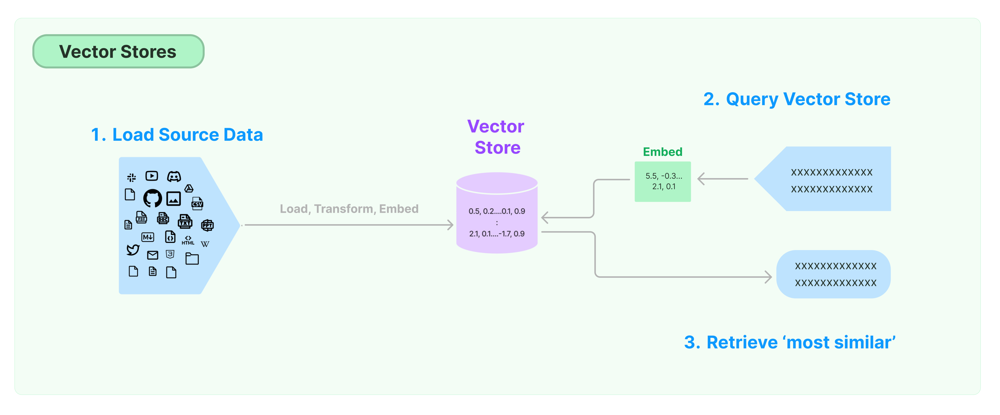

In [39]:
!pip install faiss-cpu

In [40]:
# from langchain.vectorstores import Chroma
from langchain.vectorstores import FAISS
from langchain.vectorstores import Chroma
#from pydantic_settings import BaseSettings
#from chromadb import Chroma

In [41]:
# Store the split document in ChromaDB (It takes approximately 5-10 mins to
# create the embeddings)
db = Chroma.from_documents(csv_data, OpenAIEmbeddings(openai_api_key=openai_api_key))

Perform Similarity Search

In [42]:
query = "Find me some red color kurtas?"
docs = db.similarity_search(query)


In [43]:
len(docs)

4

In [44]:
docs[0]

Document(page_content="combined_text: name: HERE&NOW Pink & Red Floral Printed Kurti\nproducts: Kurti\nprice: 1299.0\ncolour: Pink\nbrand: HERE&NOW\nratingCount: 15.0\navg_rating: 4.133333333333334\ndescription: Pink and red a-line kurti Floral printed Round neck,  three-quarter,  regular sleeves Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash\nBody or Garment Size: Garment Measurements in\nNeck: Round Neck\nNumber of Pockets: NA\nOccasion: Daily\nOrnamentation: NA\nPrint or Pattern Type: Floral\nSleeve Length: Three-Quarter Sleeves\nSleeve Styling: Regular Sleeves\nSlit Detail: Side Slits\nSustainable: Regular\nTechnique: NA\nWash Care: Machine Wash\nWeave Pattern: Regular\nWeave Type: Knitted and Woven\nDesign Styling: Regular\nFabric: Viscose Rayon\nHemline: Straight\nPattern: Printed\nShape: A-Line\nCare for me: Follow the washcare label on garment. Use cold water with mild detergents when handwashing or opt for delicate 

In [45]:
#df_output.drop(columns=list(df_results.columns), inplace=True)

#df_output = pd.DataFrame(columns=["Filename","source","row","p_id","img","combined_text"])
df_output = pd.DataFrame()
print(df_output)

for doc in docs:
  page_content = doc.page_content
  filename = doc.metadata['Filename']
  source = doc.metadata['source']
  row = doc.metadata['row']
  p_id = doc.metadata['p_id']
  img = doc.metadata['img']
  new_row = {"source": source, "Filename": filename, "p_id": p_id, "img": img,  "row": row,  "combined_text": page_content}
  #df_output.reset_index(inplace=True)
  df_output = pd.concat([df_output, pd.DataFrame([new_row])],ignore_index=True)

df_output

Empty DataFrame
Columns: []
Index: []


,source,Filename,p_id,img,row,combined_text
0,/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/preprocessed.csv,Fashion Dataset v2.csv,18226110,http://assets.myntassets.com/assets/images/18226110/2022/5/18/1c757eb2-e31c-4cdb-a6b8-b9b079c2a85c1652869578465-HERENOW-Women-Kurtis-3111652869577933-1.jpg,7728,"combined_text: name: HERE&NOW Pink & Red Floral Printed Kurti\nproducts: Kurti\nprice: 1299.0\ncolour: Pink\nbrand: HERE&NOW\nratingCount: 15.0\navg_rating: 4.133333333333334\ndescription: Pink and red a-line kurti Floral printed Round neck, three-quarter, regular sleeves Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash\nBody or Garment Size: Garment Measurements in\nNeck: Round Neck\nNumber of Pockets: NA\nOccasion: Daily\nOrnamentation: NA\nPrint or Pattern Type: Floral\nSleeve Length: Three-Quarter Sleeves\nSleeve Styling: Regular Sleeves\nSlit Detail: Side Slits\nSustainable: Regular\nTechnique: NA\nWash Care: Machine Wash\nWeave Pattern: Regular\nWeave Type: Knitted and Woven\nDesign Styling: Regular\nFabric: Viscose Rayon\nHemline: Straight\nPattern: Printed\nShape: A-Line\nCare for me: Follow the washcare label on garment. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing \r\nAlways wash inside-out to preserve colour \r\nNever wring or tumble dry. Dry flat on a towel or hang on coat hangers \r\nIron on the reverse side with medium heat"
1,/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/preprocessed.csv,Fashion Dataset v2.csv,18226124,http://assets.myntassets.com/assets/images/18226124/2022/5/18/5bbc6903-2b40-4eb1-be53-4ab6a4d3f92b1652869850135-HERENOW-Women-Kurtis-701652869849589-1.jpg,7551,"combined_text: name: HERE&NOW Red & Blue Ethnic Motifs Printed Pure Cotton Kurti\nproducts: Kurti\nprice: 1299.0\ncolour: Red\nbrand: HERE&NOW\ndescription: Red and blue a-line kurti Ethnic motifs printed Round neck, three-quarter, regular sleeves Knitted and woven regular pure cotton Pure Cotton Machine washThe model (height 5'8) is wearing a size S\nBody or Garment Size: Garment Measurements in\nNeck: Round Neck\nNumber of Pockets: NA\nOccasion: Daily\nOrnamentation: NA\nPrint or Pattern Type: Ethnic Motifs\nSleeve Length: Three-Quarter Sleeves\nSleeve Styling: Regular Sleeves\nSlit Detail: Side Slits\nSustainable: Regular\nTechnique: NA\nWash Care: Machine Wash\nWeave Pattern: Regular\nWeave Type: Knitted and Woven\nDesign Styling: Regular\nFabric: Pure Cotton\nHemline: Straight\nPattern: Printed\nShape: A-Line\nCare for me: Wash in cold water to avoid shrinkage \r\nLine-dry in shade to avoid yellowing \r\nFor whites, wash with non-chlorine bleach on a hot water setting \r\nIron when slightly damp"
2,/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/preprocessed.csv,Fashion Dataset v2.csv,3084524,http://assets.myntassets.com/assets/images/3084524/2018/4/17/11523957803243-HERENOW-Women-Kurtas-8681523957803163-1.jpg,155,"combined_text: name: HERE&NOW Women Red Printed A-Line Kurta\nproducts: Kurta\nprice: 1799.0\ncolour: Red\nbrand: HERE&NOW\nratingCount: 2669.0\navg_rating: 4.100037467216186\ndescription: Red and golden printed A-line kurta with slits, has a tie-up neck, three-quarter sleeves with tie-ups, flared hem, no slitsThe model (height 5'8"") is wearing a size SViscose Rayon Hand-wash\nBody Shape ID: 443,333,424\nBody or Garment Size: Garment Measurements in\nMain Trend: NA\nNeck: Keyhole Neck\nOccasion: Daily\nOrnamentation: Beads and Stones\nPrint or Pattern Type: Ethnic Motifs\nSleeve Length: Three-Quarter Sleeves\nSleeve Styling: Regular Sleeves\nSlit Detail: NA\nStitch: Ready to Wear\nTechnique: NA\nWash Care: Hand Wash\nWeave Pattern: Regular\nWeave Type: Machine Weave\nColour Family: Bright\nDesign Styling: Empire\nFabric: Viscose Rayon\nFabric 2: NA\nFabric Purity: Synthetic\nHemline: Flared\nLength: Calf Length\nPattern: Printed\nShape: A-Line"
3,/content/drive/MyDrive/Colab Notebooks/Mynt

In [46]:
list_of_output_p_id = df_output['p_id'].to_list()
list_of_output_p_id

['18226110', '18226124', '3084524', '15635998']

In [125]:
from IPython.display import Image, HTML

def display_images_with_query_output(df) -> None:
    for index, row in df.iterrows():
        image_url = str(row['img'])  # Ensure this is a valid image URL

        # Display the image using IPython.Image (assuming simple image links)
        display(Image(url=image_url, width=200, height=300))  # Reduce image width

        # Extract and format key-value pairs from 'combined_text'
        combined_text = row['combined_text']
        combined_text = combined_text.replace('combined_text: ', '')  # Replace newlines with HTML line breaks
        key_value_pairs = [pair.strip().split(': ', 1) for pair in combined_text.split('\n')]


        # Create transposed mini-table DataFrame (handling empty values)
        mini_table_df = pd.DataFrame.from_records(key_value_pairs, columns=['Attribute', 'Value'])
        mini_table_df.dropna(inplace=True) #= mini_table_df.fillna('-')  # Replace missing values with '-'

        # Generate HTML for mini table (transpose format)
        mini_table_html = "<table>"
        for col_name, value in mini_table_df.iterrows():
            mini_table_html += f"<tr><td><b>{value['Attribute']}</b></td><td>{value['Value']}</td></tr>"
        mini_table_html += "</table>"

        # Display the mini table using HTML
        display(HTML(mini_table_html))


# Display images with mini tables for the first 3 images
display_images_with_query_output(df_output)

name,HERE&NOW Pink & Red Floral Printed Kurti
products,Kurti
price,1299.0
colour,Pink
brand,HERE&NOW
ratingCount,15.0
avg_rating,4.133333333333334
description,"Pink and red a-line kurti Floral printed Round neck, three-quarter, regular sleeves Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash"
Body or Garment Size,Garment Measurements in
Neck,Round Neck
Number of Pockets,NA


name,HERE&NOW Red & Blue Ethnic Motifs Printed Pure Cotton Kurti
products,Kurti
price,1299.0
colour,Red
brand,HERE&NOW
description,"Red and blue a-line kurti Ethnic motifs printed Round neck, three-quarter, regular sleeves Knitted and woven regular pure cotton Pure Cotton Machine washThe model (height 5'8) is wearing a size S"
Body or Garment Size,Garment Measurements in
Neck,Round Neck
Number of Pockets,NA
Occasion,Daily
Ornamentation,NA


name,HERE&NOW Women Red Printed A-Line Kurta
products,Kurta
price,1799.0
colour,Red
brand,HERE&NOW
ratingCount,2669.0
avg_rating,4.100037467216186
description,"Red and golden printed A-line kurta with slits, has a tie-up neck, three-quarter sleeves with tie-ups, flared hem, no slitsThe model (height 5'8"") is wearing a size SViscose Rayon Hand-wash"
Body Shape ID,"443,333,424"
Body or Garment Size,Garment Measurements in
Main Trend,NA


name,Anubhutee Red & Gold Geometric Printed Pleated Kurti
products,Kurti
price,1739.0
colour,Red
brand,Anubhutee
ratingCount,50.0
avg_rating,3.84
description,"Red and gold straight kurti Geometric printed Round neck, three-quarter, regular sleeves Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Hand wash"
Body or Garment Size,Garment Measurements in
Neck,Round Neck
Number of Pockets,NA


In [60]:
# Create a function for web app interface using Gradio


def similarity_search_results(query: str) -> pd.DataFrame():
    """
    Args:
      query:  query to perform similarity search

    Returns:
      df_output: dataframe with the results
    """
    docs = db.similarity_search(query)
    if len(docs) > 0:
      df_output = pd.DataFrame()
      for doc in docs:
        page_content = doc.page_content
        filename = doc.metadata['Filename']
        source = doc.metadata['source']
        row = doc.metadata['row']
        p_id = doc.metadata['p_id']
        img = doc.metadata['img']
        new_row = {"source": source, "Filename": filename, "p_id": p_id, "img": img,  "row": row,  "combined_text": page_content}
        df_output = pd.concat([df_output, pd.DataFrame([new_row])],ignore_index=True)

      return df_output
    else:
      return pd.DataFrame()

In [121]:
import tempfile

# Create a white image

width, height = 200, 400
image = Image.new('RGB', (width, height), (255, 255, 255))

# Save the image to a temporary file
with tempfile.NamedTemporaryFile(suffix='.png') as f:
    image.save(f, 'PNG')

# Get the URL of the temporary file
url = f.name


In [137]:

# Test the functions

def generate_images_and_output_with_similarity_search(query: str):
    """
    Args:
      query:  query to perform similarity search

    Returns:
      image_url_list: list of image URLs
      mini_table_html_list: list of HTML mini tables
    """
    df = similarity_search_results(query)

    global image_url_list, mini_table_html_list, combined_text_list, output_list
    image_url_list = []
    mini_table_html_list = []
    combined_text_list = []
    output_list = []
    #image_url_list = [url, url, url, url]
    #mini_table_html_list = ["-","-","-","-"]

    for index, row in df.iterrows():
        image_url = str(row['img'])  # Ensure this is a valid image URL

        image_url_list.append(image_url)

        # Display the image using IPython.Image (assuming simple image links)
        #display(Image(url=image_url, width=200, height=300))  # Reduce image width

        # Extract and format key-value pairs from 'combined_text'
        combined_text = row['combined_text']
        combined_text = combined_text.replace('combined_text: ', '')
        key_value_pairs = [pair.strip().split(': ', 1) for pair in combined_text.split('\n')]


        # Create transposed mini-table DataFrame (handling empty values)
        mini_table_df = pd.DataFrame.from_records(key_value_pairs, columns=['Attribute', 'Value'])
        mini_table_df.dropna(inplace=True)
        mini_table_df['Attribute'] = mini_table_df['Attribute'].str.capitalize()
        mini_table_html = mini_table_df.to_html(index=False, justify='left')

        #combined_text_list.append(mini_table_df.to_list())

        # Generate HTML for mini table (transpose format)
        #mini_table_html = "<table>"
        #for col_name, value in mini_table_df.iterrows():
        #    mini_table_html += f"<tr><td><b>{value['Attribute']}</b></td><td>{value['Value']}</td></tr>"
        #mini_table_html += "</table>"

        mini_table_html_list.append(mini_table_html)

    if len(image_url_list) < 4:
      buffer = 4 - len(image_url_list)
      for i in range(buffer):
        image_url_list.append(url)
        mini_table_html_list.append("-")

    output_list = [image_url_list[0],
                   mini_table_html_list[0],
                   image_url_list[1],
                   mini_table_html_list[1],
                   image_url_list[2],
                   mini_table_html_list[2],
                   image_url_list[3],
                   mini_table_html_list[3]]


    return output_list



In [146]:
# Create a Web App using Gradio
import gradio as gr

global image_url_list, mini_table_html_list, combined_text_list, output_list
image_url_list = []
mini_table_html_list = []
combined_text_list = []
image_url_list = [url, url, url, url]
mini_table_html_list = ["-","-","-","-"]
combined_text_list = ["-","-","-","-"]
output_list = [url,"-",url,"-",url,"-",url,"-"]
with gr.Blocks() as demo:
    gr.Markdown("# Myntra Product Search App (langchain)")
    with gr.Row():
      with gr.Column(scale=4):
        search_box = gr.Textbox(label="Your search query for myntra apparel products", placeholder="Enter your search query here...", lines=2)
      with gr.Column(scale=1):
        search_button = gr.Button("Search")

    # Create two columns for images and mini-tables


    with gr.Row():
      with gr.Column(scale=1):  # Row for Image 0
       image_output_0 = gr.Image(value=image_url_list[0], width=200, height=400, interactive=True)
      with gr.Column(scale=4):  # Row for mini table list 0
       mini_table_output_0 = gr.HTML(value=mini_table_html_list[0])
    with gr.Row():
      with gr.Column(scale=1):  # Row for Image 1
        image_output_1 = gr.Image(value=image_url_list[1], width=200, height=400, interactive=True)
      with gr.Column(scale=4):  # Row for mini table list 1
       mini_table_output_1 = gr.HTML(value=mini_table_html_list[1])
    with gr.Row() :
      with gr.Column(scale=1):  # Row for Image 2
        image_output_2 = gr.Image(value=image_url_list[2], width=200, height=400, interactive=True)
      with gr.Column(scale=4):  # Row for mini table list 2
        mini_table_output_2 = gr.HTML(value=mini_table_html_list[2])
    with gr.Row():
      with gr.Column(scale=1):  # Row for Image 3
        image_output_3 = gr.Image(value=image_url_list[3], width=200, height=400, interactive=True)
      with gr.Column(scale=4):  # Row for mini table list 3
        mini_table_output_3 = gr.HTML(value=mini_table_html_list[3])

    search_button.click(fn=generate_images_and_output_with_similarity_search, inputs=[search_box], outputs=[image_output_0,
                                                                                                            mini_table_output_0,
                                                                                                            image_output_1,
                                                                                                            mini_table_output_1,
                                                                                                            image_output_2,
                                                                                                            mini_table_output_2,
                                                                                                            image_output_3,
                                                                                                            mini_table_output_3])

gr.close_all()
demo.launch(debug=True,inbrowser=True)
#demo.close()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://c804f3f0940c084729.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7868 <> https://c804f3f0940c084729.gradio.live


LangChain also support all major vector stores and databases such as FAISS, ElasticSearch, LanceDB, Milvus, Pinecone etc. Refer to the [API documentation](https://api.python.langchain.com/en/latest/api_reference.html#module-langchain.vectorstores) for the complete list.

# Llama Index Setup

In [52]:
# NOTE: This is ONLY necessary in jupyter notebook.
# Details: Jupyter runs an event-loop behind the scenes.
#          This results in nested event-loops when we start an event-loop to make async queries.
#          This is normally not allowed, we use nest_asyncio to allow it for convenience.
import nest_asyncio

nest_asyncio.apply()

# Core Components Of LlamaIndex
1.   Index
2.   Reriever
3.   Response Synthesizer.
4.   Query Engine.

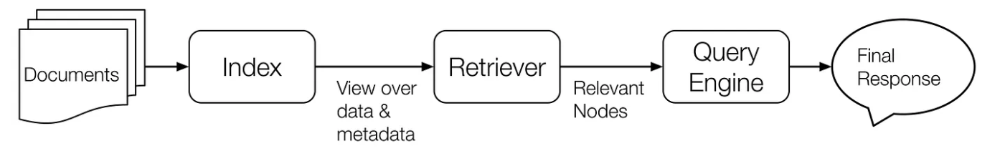

1. Index: It's the "library" of your data - Stores your data.
2. Retriever: It's the "librarian" that finds relevant data - Finds data.
3. Response Synthesizer: It's the "storyteller" that creates a response - Makes responses.
4. QueryEngine: It's the "director" that makes everything work together - Coordinates everything.

In this section, we will create a node parser and parse the documents into nodes. These nodes are the basic units of data for the question-answering system. The code will then build an index based on these nodes and later a query engine will be created from the index.

The purpose of these steps is to establish the infrastructure for a question-answering system within the LlamaIndex framework, enabling users to retrieve information and answers from the indexed documents.

In the provided code, several methods and functions are used from different libraries and modules. Here's a breakdown of the methods and functions along with details of the parameters used:

1. `SimpleNodeParser.from_defaults()`:
   - Method: `from_defaults()`
   - Class: `SimpleNodeParser`
   - Purpose: Create a `SimpleNodeParser` instance with default settings.
   - Parameters: This method is called without any explicit parameters, so it uses the default settings of the `SimpleNodeParser` class.

2. `parser.get_nodes_from_documents(documents)`:
   - Method: `get_nodes_from_documents()`
   - Object: `parser`
   - Purpose: Parse a list of documents into nodes.
   - Parameters:
     - `documents`: A list of documents to be parsed into nodes.

3. `VectorStoreIndex(nodes)`:
   - Class: `VectorStoreIndex`
   - Purpose: Create an index using the provided nodes.
   - Parameters:
     - `nodes`: A list of nodes obtained from document parsing.

4. `index.as_query_engine()`:
   - Method: `as_query_engine()`
   - Object: `index`
   - Purpose: Convert the `VectorStoreIndex` into a query engine.
   - Parameters: This method does not take any explicit parameters.

5. `query_engine.query("What is the revenue of Uber in 2021?")`:
   - Method: `query()`
   - Object: `query_engine`
   - Purpose: Perform a query using the query engine.
   - Parameters:
     - `"What is the revenue of Uber in 2021?"`: The query string passed as a parameter to the `query()` method.

6. `display(HTML(f'<p style="font-size:20px">{response.response}</p>'))`:
   - Function: `display(HTML())`
   - Library: `IPython.display`
   - Purpose: Display the synthesized response with HTML formatting.
   - Parameters:
     - `HTML(f'<p style="font-size:20px">{response.response}</p>')`: An HTML-formatted response to be displayed. The `response.response` contains the synthesized text, which is wrapped in an HTML `<p>` element with a specific font size.

In [53]:
from llama_index.llms.openai import OpenAI
from llama_index.core.llms import ChatMessage

# Data Connectors

A Data Connector in LlamaIndex is a functional component that facilitates the conversion of data from various sources like PDFs, YouTube videos, Audio files, webpages, Wikipedia pages, SQL Databases, docx files into a Document format, making it ready for ingestion by LlamaIndex.

There are 100+ data connectors/ data loaders available in LlamaHub - a simple library of all the data loaders / readers as shown below.

[llamahub.ai](https://llama-hub-ui.vercel.app/)

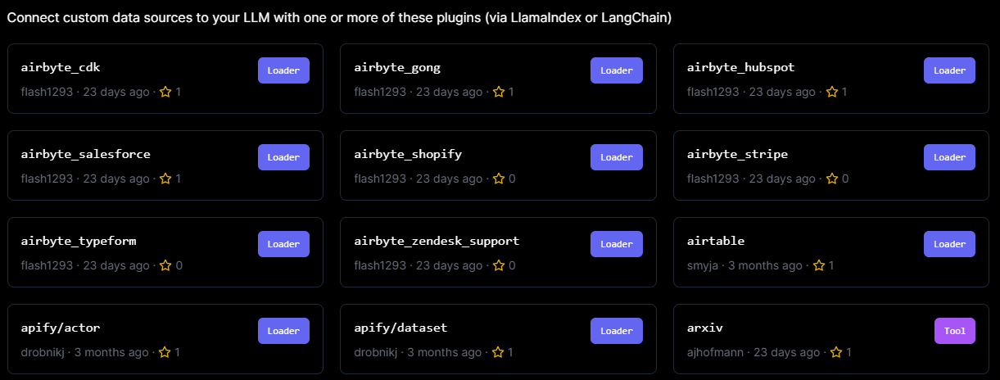



In [58]:
help(download_loader)

Help on function download_loader in module llama_index.core.readers.download:

download_loader(loader_class: str, loader_hub_url: str = '', refresh_cache: bool = False, use_gpt_index_import: bool = False, custom_path: Optional[str] = None) -> Type[llama_index.core.readers.base.BaseReader]
    Download a single loader from the Loader Hub.
    
    Args:
        loader_class: The name of the loader class you want to download,
            such as `SimpleWebPageReader`.
        refresh_cache: If true, the local cache will be skipped and the
            loader will be fetched directly from the remote repo.
        use_gpt_index_import: If true, the loader files will use
            llama_index as the base dependency. By default (False),
            the loader files use llama_index as the base dependency.
            NOTE: this is a temporary workaround while we fully migrate all usages
            to llama_index.
        custom_path: Custom dirpath to download loader into.
    
    Returns:

In [55]:
from csv import reader
from pathlib import Path
from llama_index.core import download_loader
from llama_index.readers.file import CSVReader
#help(CSVReader)
reader = CSVReader()
documents = reader.load_data(file=Path('/content/drive/MyDrive/Colab Notebooks/Myntra Dataset/preprocessed.csv'))
#PDFReader = download_loader("PDFReader")
documents[0]
#loader = PDFReader()
#documents = loader.load_data(file=Path('./Uber-2021-Annual-Report.pdf'))

Document(id_='b9fb7854-4d8b-4ea9-9567-a5bb70ff8680', embedding=None, metadata={'filename': 'preprocessed.csv', 'extension': '.csv'}, excluded_embed_metadata_keys=[], excluded_llm_metadata_keys=[], relationships={}, text='Filename, p_id, img, combined_text\nFashion Dataset v2.csv, 17048614, http://assets.myntassets.com/assets/images/17048614/2022/2/4/b0eb9426-adf2-4802-a6b3-5dbacbc5f2511643971561167KhushalKWomenBlackEthnicMotifsAngrakhaBeadsandStonesKurtawit7.jpg, name: Khushal K Women Black Ethnic Motifs Printed Kurta with Palazzos & With Dupatta\nproducts: Kurta, Palazzos, Dupatta\nprice: 5099.0\ncolour: Black\nbrand: Khushal K\nratingCount: 4522.0\navg_rating: 4.4183989385227775\ndescription: Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar,  three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure D

In [57]:
from llama_index.core.node_parser import SimpleNodeParser
from llama_index.core import VectorStoreIndex
from IPython.display import display, HTML

# create parser and parse document into nodes
parser = SimpleNodeParser.from_defaults()
nodes = parser.get_nodes_from_documents(documents)

# # build index
index = VectorStoreIndex(nodes)

# Construct Query Engine
query_engine = index.as_query_engine()
